<a href="https://colab.research.google.com/github/AyushSingh331/Dog-Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dog Breed Classification Model Using TensorFlow

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub version:",hub.__version__)

#Check For GPU Availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available


Getting our Data Ready by Turning our Images into Tensors

In [ ]:
import pandas as pd

labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


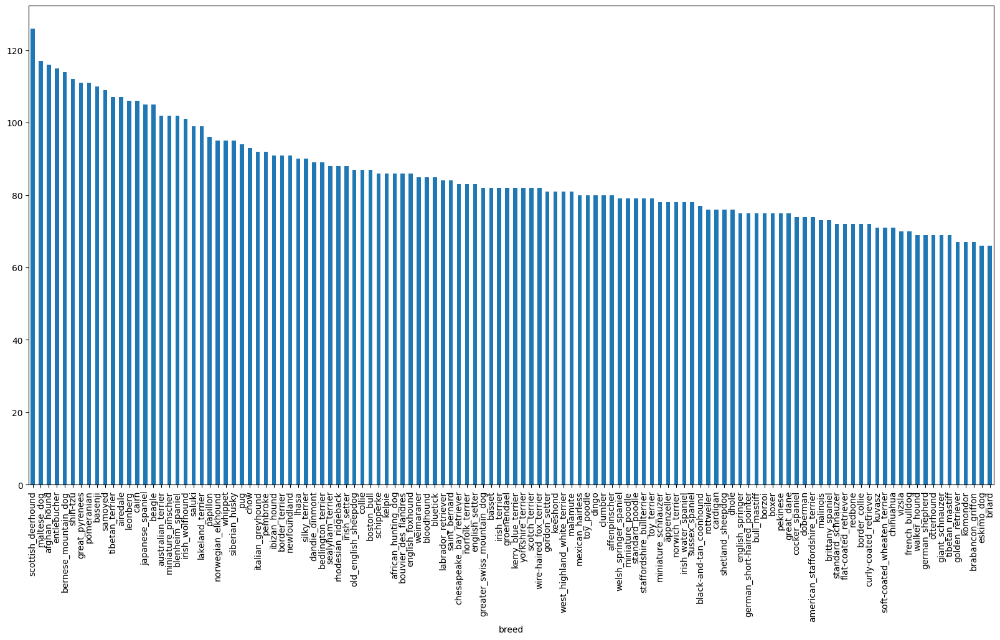

In [ ]:
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(20,10));

### Getting the Images and their Labels

In [ ]:
filenames=["drive/MyDrive/Dog Vision/dog-breed-identification/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

### Turning Every Label into Boolean Array

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]
print(len(boolean_labels))
boolean_labels[:2]

10222


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own Validation Set




In [ ]:
x=filenames
y=boolean_labels

In [ ]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000}

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

### Preprocessing Images

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224 #To have all Images of the same size

def process_image(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path) #Read an image file
  image=tf.image.decode_jpeg(image,channels=3) #Turn jpeg image into numerical Tensor with 3 color channels(R,G,B)
  image=tf.image.convert_image_dtype(image,tf.float32) #Convert it from 0-255 to 0-1
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE]) #Resize the image to 224x224
  return image

### Turning our Data into Batches

In [ ]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
BATCH_SIZE=32

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """y=None beacuse the test data does not have any labels"""
  if test_data:
    data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

def show_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

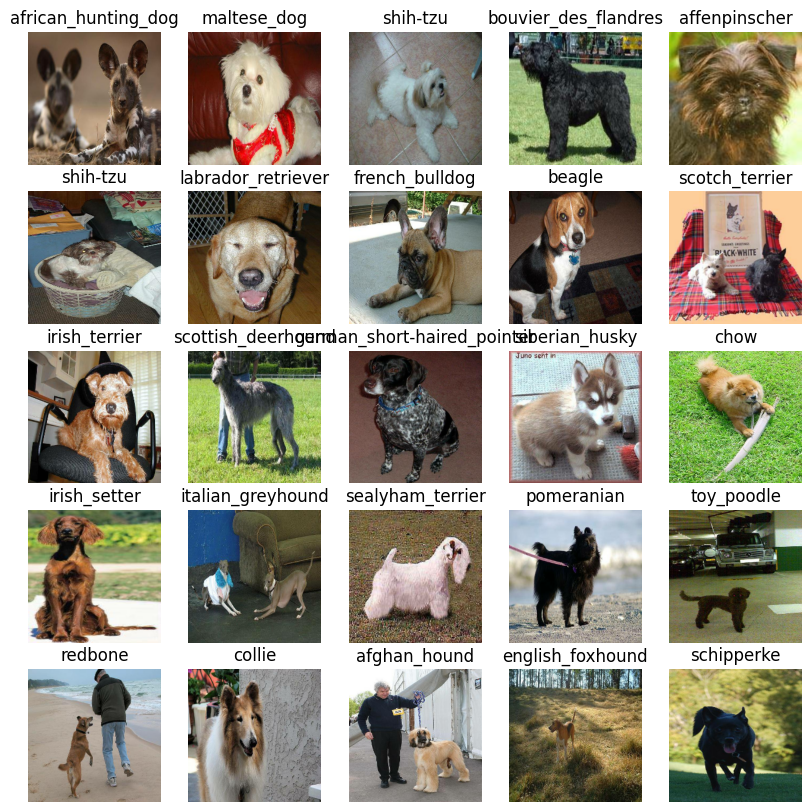

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

## Building A Model

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #Input Shape of the Model
OUTPUT_SHAPE=len(unique_breeds) #Output Shape of the Model
MODEL_URL="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building Model with:",model_url)
  # Wrap hub.KerasLayer within a custom Layer
  class HubLayer(tf.keras.layers.Layer):
      def __init__(self, model_url, **kwargs):
          super(HubLayer, self).__init__(**kwargs)
          self._model_url = model_url
          self._hub_layer = hub.KerasLayer(model_url)

      def call(self, inputs):
          return self._hub_layer(inputs)

  model=tf.keras.Sequential([HubLayer(MODEL_URL, input_shape=input_shape[1:]), #Input Layer
                             tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")]) #Output Layer

  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["Accuracy"])

  return model


In [ ]:
model=create_model();
model.summary()

Building Model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


/tmp/ipython-input-925333061.py:6: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super(HubLayer, self).__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ hub_layer (HubLayer)            │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       120,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

### Creating Callbacks

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
import os

def tensorboard_callback():
  logdir=os.path.join("/content/drive/MyDrive/Dog Vision/dog-breed-identification/Logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

### Early Stopping Callback to Prevent Overfitting

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_Accuracy",patience=3,mode='max')

### Training A Model(First on 1000 images)

In [ ]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
def train_model():
  model=create_model() #Create The Model
  tensorboard = tensorboard_callback() # Call the correct function

  #Fit the Model to the Data Passing it the Callback we Created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model=train_model()

Building Model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


/tmp/ipython-input-925333061.py:6: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super(HubLayer, self).__init__(**kwargs)


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 153s 6s/step - Accuracy: 0.0539 - loss: 5.2055 - val_Accuracy: 0.2600 - val_loss: 3.3670
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 57s 122ms/step - Accuracy: 0.6481 - loss: 1.8455 - val_Accuracy: 0.5050 - val_loss: 2.0174
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 173ms/step - Accuracy: 0.9424 - loss: 0.5704 - val_Accuracy: 0.6200 - val_loss: 1.5561
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - Accuracy: 0.9886 - loss: 0.2450 - val_Accuracy: 0.6500 - val_loss: 1.3913
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - Accuracy: 0.9995 - loss: 0.1317 - val_Accuracy: 0.6750 - val_loss: 1.3275
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - Accuracy: 0.9954 - loss: 0.0939 - val_Accuracy: 0.6800 - val_loss: 1.2791
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - Accuracy: 1.0000 - loss: 0.0709 - val_Accuracy: 0.6800 - val_loss: 1.2545
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - Accuracy: 1.0000 - loss: 0.0539 - val_Accu

### Checking the Tensorboard Logs

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/dog-breed-identification/Logs

<IPython.core.display.Javascript object>

## Making and Evaluating a Trained Model

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 440ms/step


array([[4.32017347e-04, 2.66748451e-04, 2.10827900e-04, ...,
        3.31035786e-04, 3.96582000e-05, 8.04566545e-04],
       [4.19561024e-04, 2.28425511e-03, 1.01377186e-03, ...,
        1.06444997e-04, 6.96552545e-03, 5.57994972e-05],
       [1.94533072e-07, 1.26005625e-05, 2.69873108e-05, ...,
        3.59941805e-05, 3.79651865e-05, 6.58728601e-03],
       ...,
       [2.09088430e-05, 1.41821540e-04, 1.59649608e-06, ...,
        1.60950331e-05, 1.83524404e-04, 1.01025435e-04],
       [1.42925725e-04, 5.49187598e-06, 4.00501995e-06, ...,
        2.00857380e-06, 1.58849834e-05, 1.17090112e-03],
       [5.31885562e-05, 1.94335080e-05, 7.65565419e-05, ...,
        1.43137798e-02, 3.53442825e-04, 8.15318804e-03]], dtype=float32)

### Predictions to Text

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[24])
pred_label

'welsh_springer_spaniel'

### Unbatching the Dataset

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

## Visualizing Predictions

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

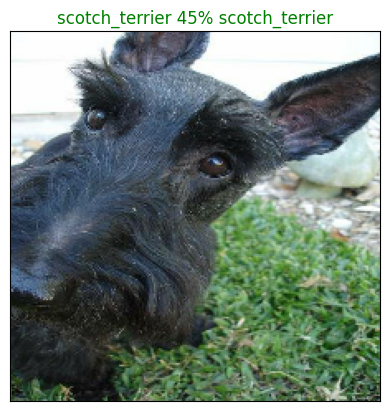

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_prob)

  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=np.array(unique_breeds)[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")

  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

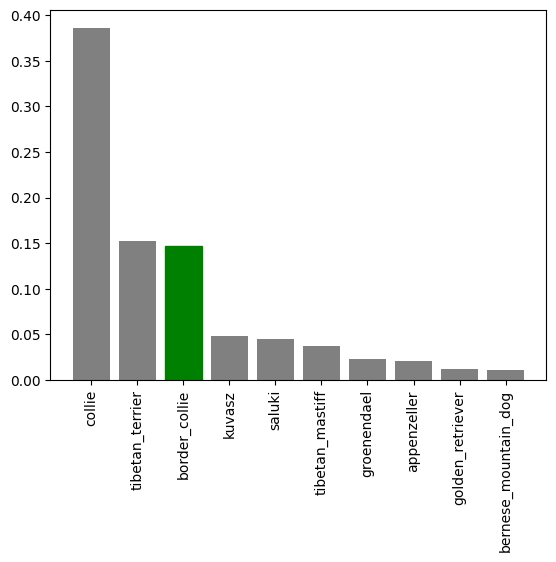

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

## Saving A Model

In [ ]:
def save_model(model,suffix=None):
  model_dir=os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/Models")
  model_path=model_dir+"-"+suffix+".h5"
  model.save(model_path)
  return model_path

## Loading A Model

In [ ]:
def load_model(model_path):
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,"1000-images-mobilenetv2-Adam")

'drive/MyDrive/Dog Vision/dog-breed-identification/Models-1000-images-mobilenetv2-Adam.h5'

## Training the Model on the Full Dataset

In [ ]:
full_data=create_data_batches(x,y)
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

/tmp/ipython-input-925333061.py:6: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super(HubLayer, self).__init__(**kwargs)


Building Model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
full_model_tensorboard=tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="Accuracy",patience=3,mode='max')

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1381s 4s/step - Accuracy: 0.4932 - loss: 2.3121
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 61s 114ms/step - Accuracy: 0.8982 - loss: 0.3538
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - Accuracy: 0.9480 - loss: 0.2023
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - Accuracy: 0.9706 - loss: 0.1311
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - Accuracy: 0.9830 - loss: 0.0913
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - Accuracy: 0.9914 - loss: 0.0622
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - Accuracy: 0.9932 - loss: 0.0507
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - Accuracy: 0.9963 - loss: 0.0402
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - Accuracy: 0.9983 - loss: 0.0290
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - Accuracy: 0.9986 - loss: 0.0249
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 110ms/step - Accuracy: 0.9980 - loss: 0.0235
Epoch 12/

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

'drive/MyDrive/Dog Vision/dog-breed-identification/Models-full-image-set-mobilenetv2-Adam.h5'

## Making Predictions on the Test Set

### Get Test Image FileNames

In [ ]:
test_path="/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e0f9b92adbba451d296678f466732969.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e4729bf465eac43afb6b04687d4703c3.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/df903a0522873bebca93d1d93bc60bc4.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e50319e7efc447bb684fbfdbed3ff041.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e18db768bc1a9e7e633940dcadacb231.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/df9ee3c663b1f2ca84781c09fa8c31f8.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/e85291fc6ba44e39defc7769fa020646.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/test/edf9eccee2542eb4fdc5757da38f0b46.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identific

### Convert FileNames into Test Batches

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

### Making Predictions on Test Data

In [ ]:
test_predictions=full_model.predict(test_data,verbose=1)

325/325 ━━━━━━━━━━━━━━━━━━━━ 1704s 5s/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Dog Vision/dog-breed-identification/test_predictions.csv",test_predictions)

In [ ]:
test_predictions=np.loadtxt("/content/drive/MyDrive/Dog Vision/dog-breed-identification/test_predictions.csv")

In [ ]:
test_predictions[:10]

array([[1.84717797e-10, 3.19555499e-13, 1.25133237e-10, ...,
        5.39405889e-08, 8.26466930e-07, 6.25757002e-10],
       [2.09614393e-09, 3.83861032e-09, 1.40764300e-07, ...,
        5.12151155e-10, 1.59832847e-09, 2.62456279e-10],
       [2.59983614e-12, 5.92689092e-11, 1.44149401e-10, ...,
        1.30575470e-08, 7.15981233e-11, 1.15367405e-13],
       ...,
       [1.76736002e-12, 9.36380076e-08, 2.30354602e-09, ...,
        2.09732801e-02, 3.15118015e-10, 5.93096806e-13],
       [2.07305097e-14, 8.63180881e-12, 2.91321736e-14, ...,
        2.06522039e-11, 3.65069134e-14, 5.43546938e-14],
       [1.64464858e-10, 7.40540962e-11, 2.68542233e-09, ...,
        7.09701737e-08, 1.62299927e-02, 5.99938090e-08]])